In [2]:
import pandas as pd

In [3]:
df=pd.read_csv('public_health_surveillance_dataset.csv')

In [4]:
df.head()

,Age,Gender,Location,Ethnicity,SES,Chronic_Conditions,Vaccination_Status,Medical_History,Immunity_Level,Reported_Symptoms,...,Hospital_Capacity,Healthcare_Personnel_Availability,Resource_Utilization,Date_of_Data_Collection,Daily_New_Cases,Vaccination_Campaign_Dates,Outbreak_Status,Infection_Risk_Level,Disease_Severity,Hospitalization_Requirement
0,51,Male,Urban,Ethnicity3,Low,0,0,NaN,Medium,Mild,...,Available,Adequate,3.737815,2023-02-23,17,2023-12-07,No Outbreak,Low Risk,Mild,Requires Hospitalization
1,92,Male,Urban,Ethnicity2,Low,1,0,NaN,Medium,Severe,...,Available,Scarce,86.838729,2024-02-29,17,2023-08-01,No Outbreak,Medium Risk,Mild,Requires Hospitalization
2,14,Male,Urban,Ethnicity3,Low,0,1,NaN,Low,NaN,...,Available,Adequate,65.644500,2023-12-20,20,2023-12-04,Ongoing Outbreak,Low Risk,Moderate,No Hospitalization
3,71,Female,Urban,Ethnicity2,Low,0,0,NaN,Medium,Moderate,...,Limited,Scarce,82.013095,2023-01-28,19,2024-03-19,No Outbreak,Low Risk,Severe,No Hospitalization
4,60,Female,Urban,Ethnicity1,Low,0,0,NaN,Low,Mild,...,Available,Adequate,56.957994,2023-03-26,18,2023-12-27,No Outbreak,Low Risk,Mild,No Hospitalization


Classification Report for RandomForest:
               precision    recall  f1-score   support

           0       0.80      0.91      0.85      7026
           1       0.20      0.09      0.13      1712

    accuracy                           0.75      8738
   macro avg       0.50      0.50      0.49      8738
weighted avg       0.69      0.75      0.71      8738

ROC AUC Score for RandomForest: 0.5008715957551524


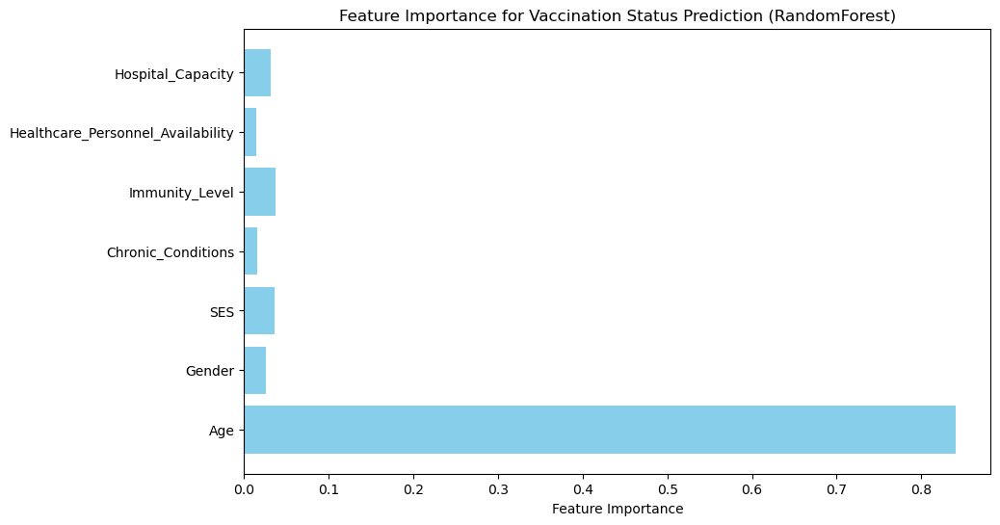

Classification Report for XGBoost:
               precision    recall  f1-score   support

           0       0.80      1.00      0.89      7026
           1       0.31      0.01      0.01      1712

    accuracy                           0.80      8738
   macro avg       0.56      0.50      0.45      8738
weighted avg       0.71      0.80      0.72      8738

ROC AUC Score for XGBoost: 0.509642755479647


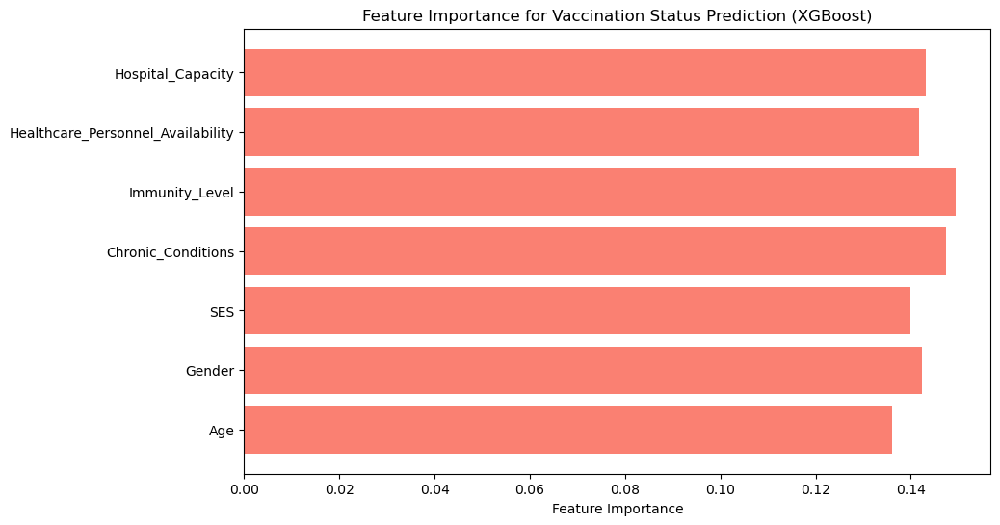

C:\Users\SAKSHI\anaconda3\envs\new_env\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\SAKSHI\anaconda3\envs\new_env\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\SAKSHI\anaconda3\envs\new_env\Lib\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result)

Classification Report for CatBoost:
               precision    recall  f1-score   support

           0       0.80      1.00      0.89      7026
           1       0.00      0.00      0.00      1712

    accuracy                           0.80      8738
   macro avg       0.40      0.50      0.45      8738
weighted avg       0.65      0.80      0.72      8738

ROC AUC Score for CatBoost: 0.4997621900364734


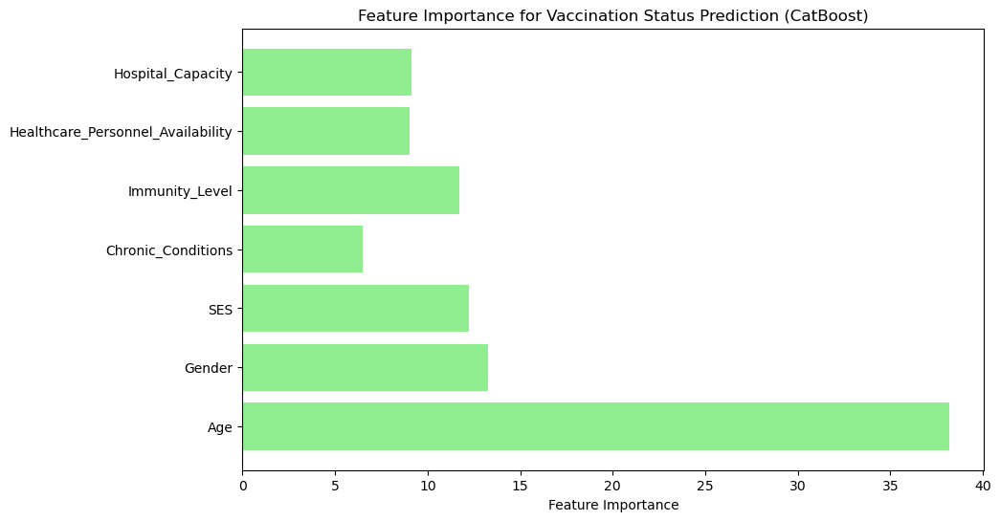

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, roc_auc_score
import xgboost as xgb
import catboost
from catboost import CatBoostClassifier

# Select relevant features and target
features = [
    'Age', 'Gender', 'SES', 'Chronic_Conditions', 'Immunity_Level', 
    'Healthcare_Personnel_Availability', 'Hospital_Capacity'
]
target = 'Vaccination_Status'

# Encode categorical variables
label_encoders = {}
for col in features:
    if df[col].dtype == 'object':
        le = LabelEncoder()
        df[col] = le.fit_transform(df[col])
        label_encoders[col] = le

# Encode the target variable
target_encoder = LabelEncoder()
df[target] = target_encoder.fit_transform(df[target])

# Define the feature matrix and target vector
X = df[features]
y = df[target]

# Split into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train RandomForest Classifier
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Make predictions and evaluate
y_pred = rf_model.predict(X_test)
y_probs = rf_model.predict_proba(X_test)[:, 1]

# Print Classification Report
print("Classification Report for RandomForest:\n", classification_report(y_test, y_pred))

# ROC AUC Score
print(f"ROC AUC Score for RandomForest: {roc_auc_score(y_test, y_probs)}")

# Feature Importance Visualization
importances = rf_model.feature_importances_
features = X.columns

# Plotting the feature importance
plt.figure(figsize=(10, 6))
plt.barh(features, importances, color='skyblue')
plt.xlabel('Feature Importance')
plt.title('Feature Importance for Vaccination Status Prediction (RandomForest)')
plt.show()

# Now let's try XGBoost as well

# Train XGBoost Classifier
xgb_model = xgb.XGBClassifier(random_state=42)
xgb_model.fit(X_train, y_train)

# Make predictions anX_train = pd.DataFrame(X_train, columns=features)
X_test = pd.DataFrame(X_test, columns=features)
d evaluate for XGBoost
y_pred_xgb = xgb_model.predict(X_test)
y_probs_xgb = xgb_model.predict_proba(X_test)[:, 1]

# Print Classification Report for XGBoost
print("Classification Report for XGBoost:\n", classification_report(y_test, y_pred_xgb))

# ROC AUC Score for XGBoost
print(f"ROC AUC Score for XGBoost: {roc_auc_score(y_test, y_probs_xgb)}")

# Feature Importance Visualization for XGBoost
importances_xgb = xgb_model.feature_importances_

# Plotting the feature importance for XGBoost
plt.figure(figsize=(10, 6))
plt.barh(features, importances_xgb, color='salmon')
plt.xlabel('Feature Importance')
plt.title('Feature Importance for Vaccination Status Prediction (XGBoost)')
plt.show()

# Now let's try CatBoost as well

# Train CatBoost Classifier
catboost_model = CatBoostClassifier(iterations=200, depth=5, learning_rate=0.1, l2_leaf_reg=1, random_state=42, verbose=0)
catboost_model.fit(X_train, y_train)

# Make predictions and evaluate for CatBoost
y_pred_cat = catboost_model.predict(X_test)
y_probs_cat = catboost_model.predict_proba(X_test)[:, 1]

# Print Classification Report for CatBoost
print("Classification Report for CatBoost:\n", classification_report(y_test, y_pred_cat))

# ROC AUC Score for CatBoost
print(f"ROC AUC Score for CatBoost: {roc_auc_score(y_test, y_probs_cat)}")

# Feature Importance Visualization for CatBoost
importances_cat = catboost_model.get_feature_importance()

# Plotting the feature importance for CatBoost
plt.figure(figsize=(10, 6))
plt.barh(features, importances_cat, color='lightgreen')
plt.xlabel('Feature Importance')
plt.title('Feature Importance for Vaccination Status Prediction (CatBoost)')
plt.show()


Fitting 5 folds for each of 54 candidates, totalling 270 fits
Best Parameters (Random Forest with SMOTE): {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 200}
Classification Report for RandomForest with SMOTE:
               precision    recall  f1-score   support

           0       0.81      0.62      0.70      7026
           1       0.20      0.38      0.26      1712

    accuracy                           0.58      8738
   macro avg       0.50      0.50      0.48      8738
weighted avg       0.69      0.58      0.62      8738

ROC AUC Score for RandomForest with SMOTE: 0.5034835979712203


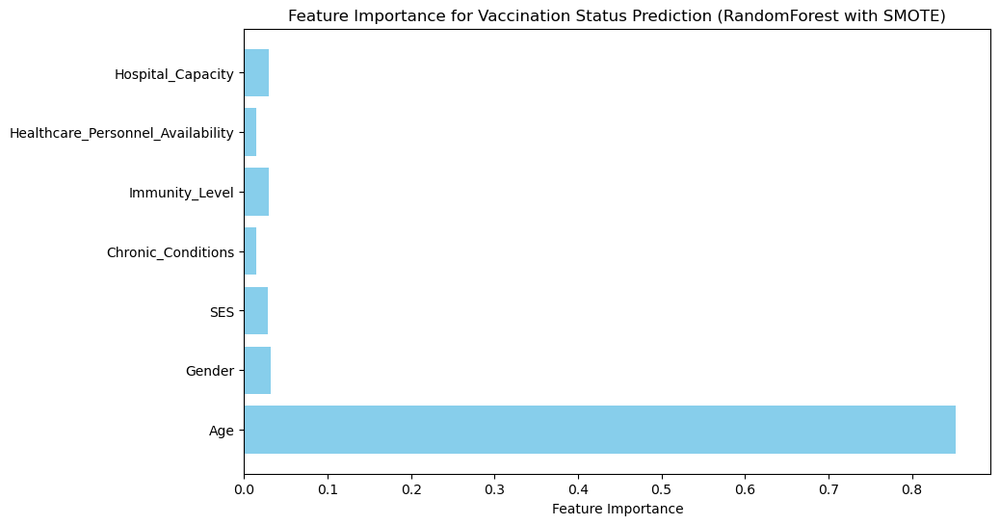

In [7]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, roc_auc_score
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
# Select relevant features and target
features = [
    'Age', 'Gender', 'SES', 'Chronic_Conditions', 'Immunity_Level', 
    'Healthcare_Personnel_Availability', 'Hospital_Capacity'
]
target = 'Vaccination_Status'

# Encode categorical variables
label_encoders = {}
for col in features:
    if df[col].dtype == 'object':
        le = LabelEncoder()
        df[col] = le.fit_transform(df[col])
        label_encoders[col] = le

# Encode the target variable
target_encoder = LabelEncoder()
df[target] = target_encoder.fit_transform(df[target])

# Define the feature matrix and target vector
X = df[features]
y = df[target]
# Example of SMOTE with Random Forest
# Use SMOTE to handle class imbalance
smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# Scale the data (important for some models, especially if using a different model later)
scaler = StandardScaler()
X_train_rescaled = scaler.fit_transform(X_train_resampled)
X_test_rescaled = scaler.transform(X_test)

# Hyperparameter Tuning with GridSearchCV
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [5, 10, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

rf_model = RandomForestClassifier(random_state=42)

# GridSearchCV to find best parameters
grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2)
grid_search.fit(X_train_rescaled, y_train_resampled)

# Best parameters from grid search
print(f"Best Parameters (Random Forest with SMOTE): {grid_search.best_params_}")

# Train model with best parameters
best_rf_model = grid_search.best_estimator_

# Make predictions and evaluate
y_pred = best_rf_model.predict(X_test_rescaled)
y_probs = best_rf_model.predict_proba(X_test_rescaled)[:, 1]

# Classification report
print("Classification Report for RandomForest with SMOTE:\n", classification_report(y_test, y_pred))

# ROC AUC Score
print(f"ROC AUC Score for RandomForest with SMOTE: {roc_auc_score(y_test, y_probs)}")

# Feature Importance Visualization
importances = best_rf_model.feature_importances_
features = X.columns

# Plotting the feature importance
plt.figure(figsize=(10, 6))
plt.barh(features, importances, color='skyblue')
plt.xlabel('Feature Importance')
plt.title('Feature Importance for Vaccination Status Prediction (RandomForest with SMOTE)')
plt.show()


Fitting 5 folds for each of 54 candidates, totalling 270 fits
Best Parameters (Random Forest with ADASYN and Class Weights): {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Classification Report for RandomForest with ADASYN and Class Weights:
               precision    recall  f1-score   support

           0       0.80      0.58      0.67      7026
           1       0.19      0.41      0.26      1712

    accuracy                           0.55      8738
   macro avg       0.50      0.50      0.47      8738
weighted avg       0.68      0.55      0.59      8738

ROC AUC Score for RandomForest with ADASYN and Class Weights: 0.5036912712062805


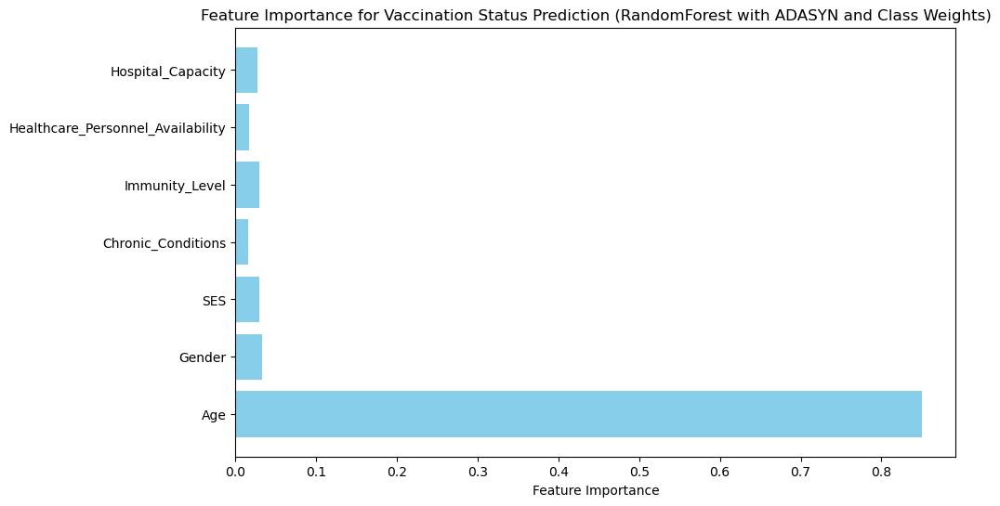

In [6]:
from imblearn.over_sampling import ADASYN
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, roc_auc_score
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

# Resample with ADASYN (an advanced version of SMOTE)
adasyn = ADASYN(random_state=42)
X_train_resampled, y_train_resampled = adasyn.fit_resample(X_train, y_train)

# Scale the data
scaler = StandardScaler()
X_train_rescaled = scaler.fit_transform(X_train_resampled)
X_test_rescaled = scaler.transform(X_test)

# Set up the Random Forest Classifier with class weights
rf_model = RandomForestClassifier(class_weight='balanced', random_state=42)

# Hyperparameter tuning using GridSearchCV
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [5, 10, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=5, n_jobs=-1, verbose=2)
grid_search.fit(X_train_rescaled, y_train_resampled)

# Best parameters from grid search
print(f"Best Parameters (Random Forest with ADASYN and Class Weights): {grid_search.best_params_}")

# Train model with best parameters
best_rf_model = grid_search.best_estimator_

# Make predictions and evaluate
y_pred = best_rf_model.predict(X_test_rescaled)
y_probs = best_rf_model.predict_proba(X_test_rescaled)[:, 1]

# Classification report
print("Classification Report for RandomForest with ADASYN and Class Weights:\n", classification_report(y_test, y_pred))

# ROC AUC Score
print(f"ROC AUC Score for RandomForest with ADASYN and Class Weights: {roc_auc_score(y_test, y_probs)}")

# Feature Importance Visualization
importances = best_rf_model.feature_importances_
features = X.columns

# Plotting the feature importance
plt.figure(figsize=(10, 6))
plt.barh(features, importances, color='skyblue')
plt.xlabel('Feature Importance')
plt.title('Feature Importance for Vaccination Status Prediction (RandomForest with ADASYN and Class Weights)')
plt.show()


In [8]:
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_auc_score

# Define model
rf_model = RandomForestClassifier(n_estimators=200, max_depth=None, 
                                  min_samples_leaf=1, min_samples_split=5)

# Apply cross-validation and evaluate using ROC AUC score
cross_val_scores = cross_val_score(rf_model, X_train, y_train, 
                                   cv=5, scoring='roc_auc')

print("Cross-validated ROC AUC Scores:", cross_val_scores)
print("Mean ROC AUC Score from Cross-validation:", cross_val_scores.mean())
# Detailed cross-validation using cross_validate
cv_results = cross_validate(rf_model, X_train, y_train, cv=5, 
                            scoring='roc_auc', return_train_score=False)

# Print out results
print("ROC AUC Scores for each fold:", cv_results['test_score'])
print("Mean ROC AUC Score:", cv_results['test_score'].mean())


Cross-validated ROC AUC Scores: [0.50167102 0.49639341 0.49171688 0.52039434 0.50662075]
Mean ROC AUC Score from Cross-validation: 0.5033592787597593
ROC AUC Scores for each fold: [0.50064529 0.49846059 0.49174905 0.5202024  0.50656301]
Mean ROC AUC Score: 0.5035240681340385


In [9]:
from catboost import CatBoostClassifier
from sklearn.model_selection import GridSearchCV, cross_val_score

# Define the model
catboost_model = CatBoostClassifier(verbose=0)

# Hyperparameters for GridSearch
param_grid_catboost = {
    'depth': [5, 7, 10],
    'iterations': [100, 200],
    'learning_rate': [0.01, 0.1, 0.2],
    'l2_leaf_reg': [1, 3, 5]
}

# Perform Grid Search with Cross Validation
grid_search_catboost = GridSearchCV(estimator=catboost_model, param_grid=param_grid_catboost, 
                                    scoring='roc_auc', cv=5, verbose=1, n_jobs=-1)

# Fit GridSearch
grid_search_catboost.fit(X_train, y_train)

# Best parameters
print("Best Parameters (CatBoost):", grid_search_catboost.best_params_)

# Use the best model from grid search
best_model_catboost = grid_search_catboost.best_estimator_

# Cross-validation for the best model
cross_val_scores_catboost = cross_val_score(best_model_catboost, X_train, y_train, cv=5, scoring='roc_auc')
print("Cross-validated ROC AUC Scores (CatBoost):", cross_val_scores_catboost)
print("Mean ROC AUC Score from Cross-validation (CatBoost):", cross_val_scores_catboost.mean())


Fitting 5 folds for each of 54 candidates, totalling 270 fits
Best Parameters (CatBoost): {'depth': 10, 'iterations': 200, 'l2_leaf_reg': 3, 'learning_rate': 0.1}
Cross-validated ROC AUC Scores (CatBoost): [0.50761535 0.51384319 0.50737186 0.52387872 0.51973814]
Mean ROC AUC Score from Cross-validation (CatBoost): 0.5144894526113246


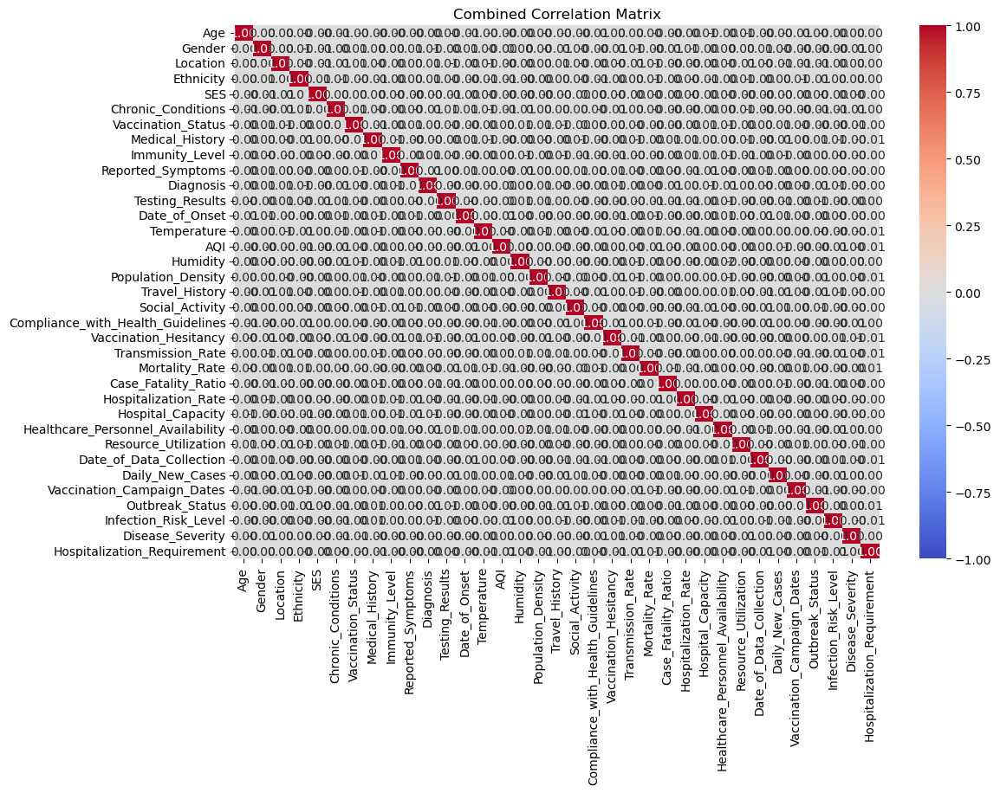

In [11]:
from sklearn.preprocessing import LabelEncoder
import seaborn as sns
# Label encoding for categorical features (if applicable)
categorical_columns = df.select_dtypes(include='object').columns
label_encoders = {}
for col in categorical_columns:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le

# Compute the correlation matrix for all features (numeric and encoded categorical)
correlation_matrix_combined = df.corr()

# Plot combined correlation heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix_combined, annot=True, cmap='coolwarm', fmt=".2f", vmin=-1, vmax=1)
plt.title('Combined Correlation Matrix')
plt.show()


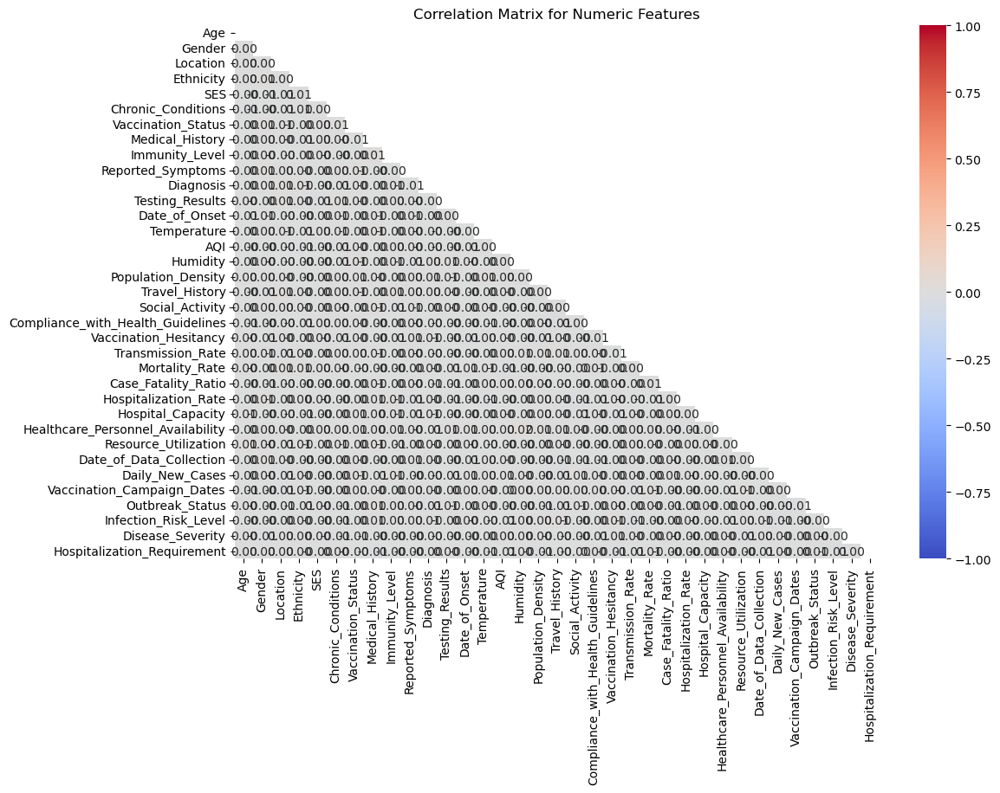

In [13]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Assuming 'df' is your DataFrame with numeric columns
numeric_columns = df.select_dtypes(include='number').columns

# Compute the correlation matrix
correlation_matrix = df[numeric_columns].corr()

# Mask the upper triangle (to avoid repetition)
mask = np.triu(np.ones_like(correlation_matrix, dtype=bool))

# Plot the full heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", mask=mask, vmin=-1, vmax=1)
plt.title('Correlation Matrix for Numeric Features')
plt.show()


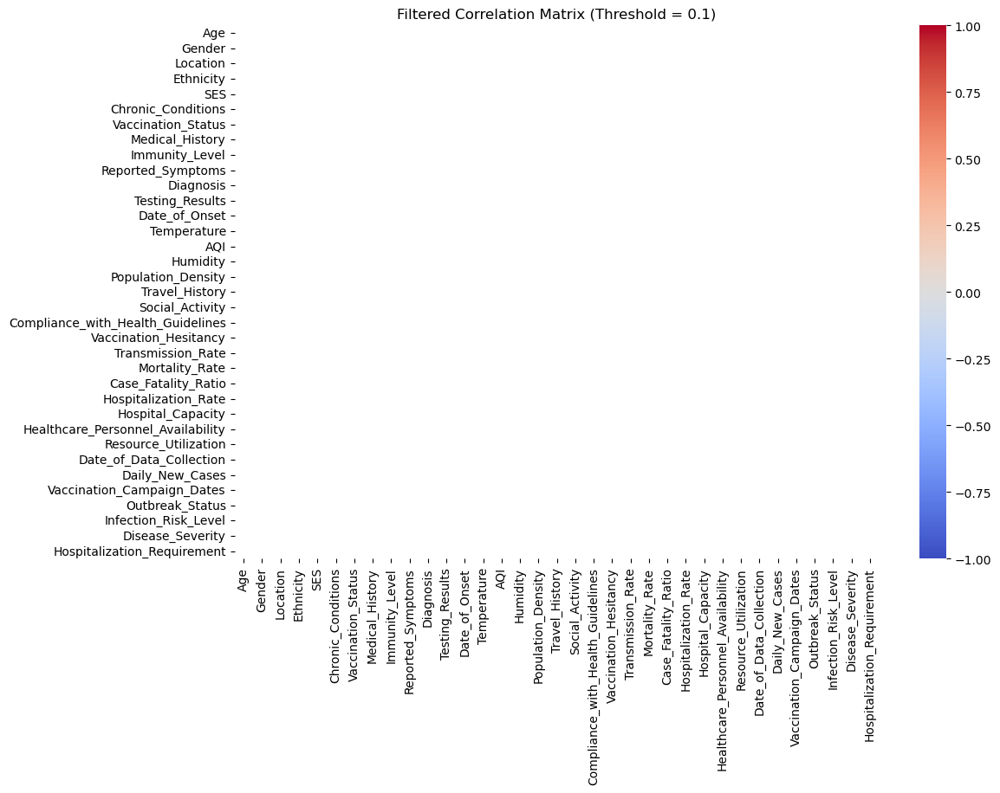

In [15]:
# Set a threshold to filter weak correlations (e.g., absolute correlation > 0.3)
threshold = 0.1
filtered_corr = correlation_matrix[abs(correlation_matrix) > threshold]

# Mask the upper triangle
mask = np.triu(np.ones_like(filtered_corr, dtype=bool))

# Plot the filtered heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(filtered_corr, annot=True, cmap='coolwarm', fmt=".2f", mask=mask, vmin=-1, vmax=1)
plt.title(f'Filtered Correlation Matrix (Threshold = {threshold})')
plt.show()


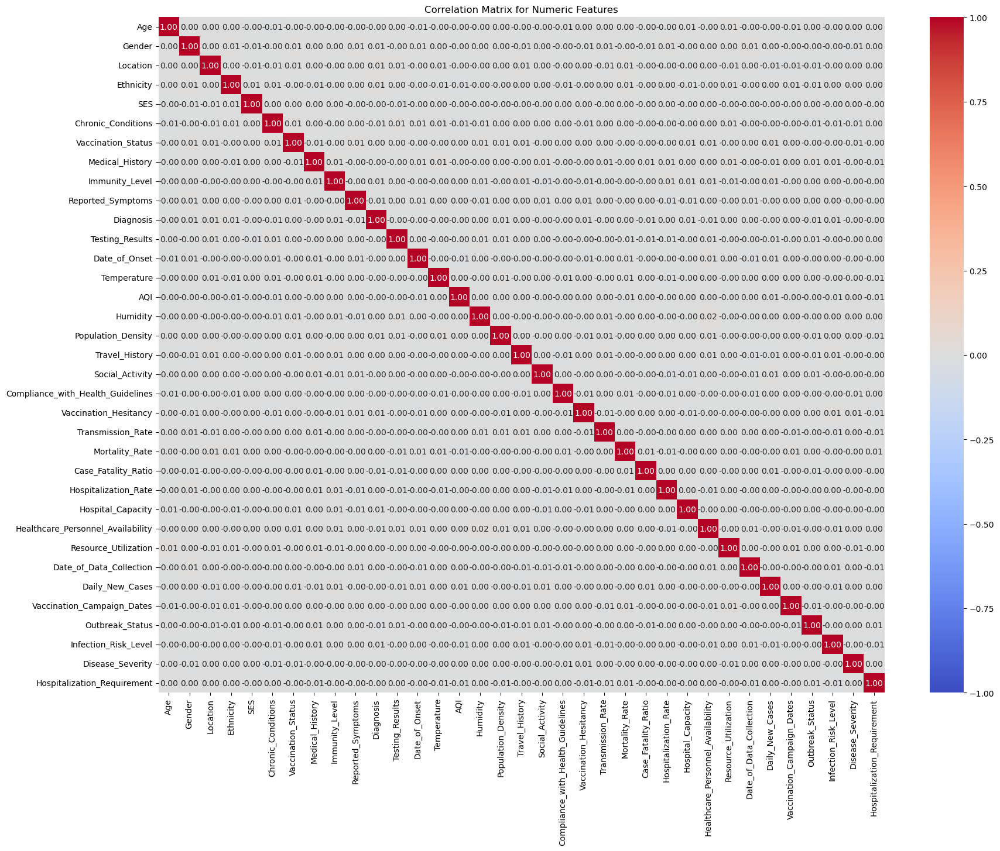

In [17]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Assuming 'df' is your DataFrame with numeric columns
numeric_columns = df.select_dtypes(include='number').columns

# Compute the correlation matrix
correlation_matrix = df[numeric_columns].corr()

# Plot the full heatmap without masking
plt.figure(figsize=(20, 15))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", vmin=-1, vmax=1)
plt.title('Correlation Matrix for Numeric Features')
plt.show()


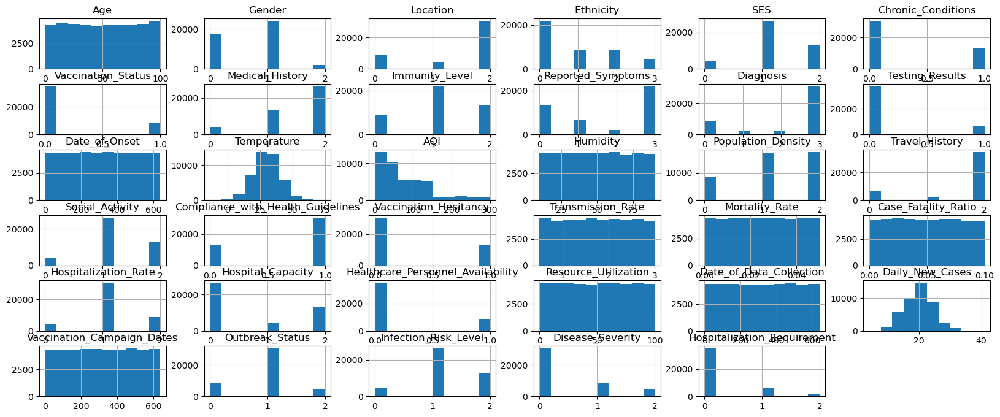

In [19]:
df[numeric_columns].hist(figsize=(20, 8))
plt.show()


In [20]:
import seaborn as sns

# Create pairplot of numeric features to visualize relationships
sns.pairplot(df[numeric_columns])
plt.show()


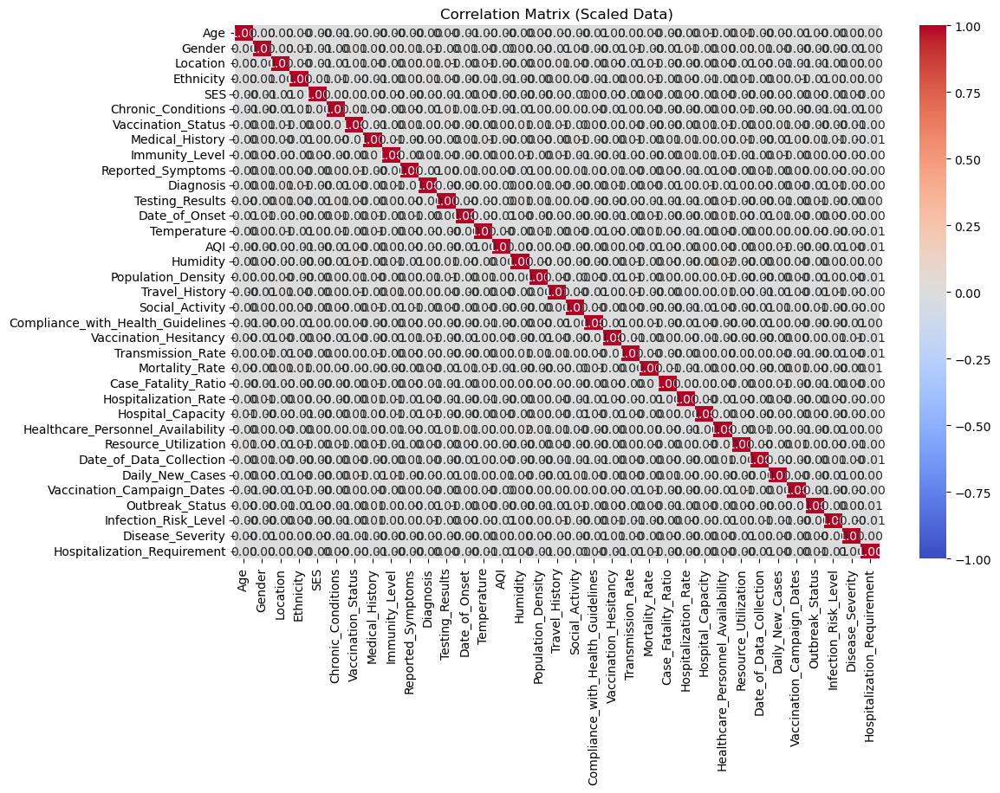

In [21]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaled_data = scaler.fit_transform(df[numeric_columns])

# Create a DataFrame from the scaled data
scaled_df = pd.DataFrame(scaled_data, columns=numeric_columns)

# Compute correlation matrix again
scaled_corr_matrix = scaled_df.corr()

# Plot the heatmap for scaled data
plt.figure(figsize=(12, 8))
sns.heatmap(scaled_corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", vmin=-1, vmax=1)
plt.title('Correlation Matrix (Scaled Data)')
plt.show()


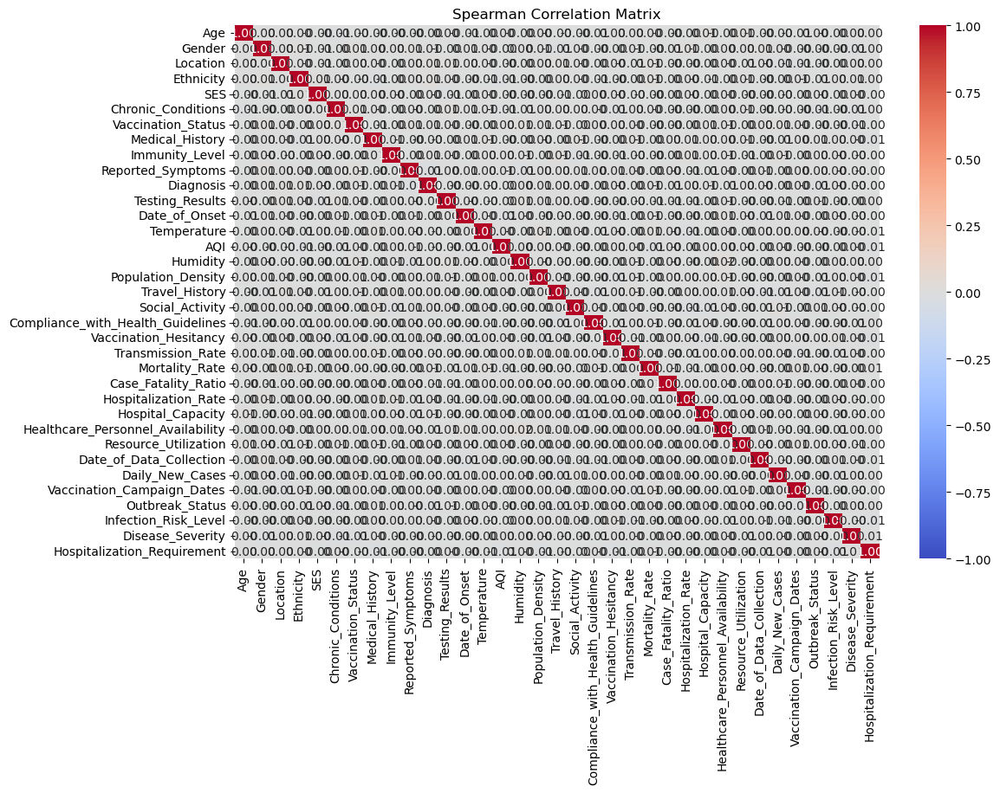

In [22]:
spearman_corr_matrix = df[numeric_columns].corr(method='spearman')

plt.figure(figsize=(12, 8))
sns.heatmap(spearman_corr_matrix, annot=True, cmap='coolwarm', fmt=".2f", vmin=-1, vmax=1)
plt.title('Spearman Correlation Matrix')
plt.show()



In [26]:
# Required imports
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, roc_auc_score
from imblearn.over_sampling import SMOTE
from imblearn.pipeline import Pipeline

# Splitting the data into features and target
X = df.drop(columns=['Vaccination_Status'])
y = df['Vaccination_Status']

# Splitting the dataset into training and testing sets (80% train, 20% test)
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a pipeline with SMOTE and Logistic Regression
smote = SMOTE(sampling_strategy='auto', random_state=42)
logreg = LogisticRegression(class_weight='balanced', solver='liblinear', max_iter=1000)

# Combine SMOTE with Logistic Regression in a pipeline
pipeline = Pipeline([
    ('smote', smote),
    ('logreg', logreg)
])

# Hyperparameter tuning using GridSearchCV
param_grid = {
    'logreg__C': [0.1, 1, 10, 100],
    'logreg__penalty': ['l2'],
    'logreg__solver': ['liblinear'],
}

grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='roc_auc', n_jobs=-1, verbose=1)

# Fit the model
grid_search.fit(X_train, y_train)

# Get the best parameters
best_params = grid_search.best_params_

# Make predictions on the test set
y_pred = grid_search.predict(X_test)

# Classification report
print("Best Parameters for Logistic Regression:", best_params)
print("Classification Report for Logistic Regression:")
print(classification_report(y_test, y_pred))

# ROC AUC Score
roc_auc = roc_auc_score(y_test, grid_search.predict_proba(X_test)[:, 1])
print("ROC AUC Score for Logistic Regression:", roc_auc)


Fitting 5 folds for each of 4 candidates, totalling 20 fits
Best Parameters for Logistic Regression: {'logreg__C': 0.1, 'logreg__penalty': 'l2', 'logreg__solver': 'liblinear'}
Classification Report for Logistic Regression:
              precision    recall  f1-score   support

           0       0.80      0.75      0.78      7026
           1       0.19      0.24      0.21      1712

    accuracy                           0.65      8738
   macro avg       0.50      0.50      0.49      8738
weighted avg       0.68      0.65      0.67      8738

ROC AUC Score for Logistic Regression: 0.4961364298426938


In [25]:
from sklearn.ensemble import RandomForestClassifier

# Initialize and train the model
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train, y_train)

# Predict and evaluate
y_pred_rf = rf_model.predict(X_test)

print("Classification Report for Random Forest:")
print(classification_report(y_test, y_pred_rf))

# ROC AUC Score
roc_auc_rf = roc_auc_score(y_test, rf_model.predict_proba(X_test)[:, 1])
print(f"ROC AUC Score for Random Forest: {roc_auc_rf}")


Classification Report for Random Forest:
              precision    recall  f1-score   support

           0       0.80      0.91      0.85      7026
           1       0.20      0.09      0.13      1712

    accuracy                           0.75      8738
   macro avg       0.50      0.50      0.49      8738
weighted avg       0.69      0.75      0.71      8738

ROC AUC Score for Random Forest: 0.5008715957551524


In [27]:
# Required imports
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, roc_auc_score
from imblearn.over_sampling import SMOTE
from imblearn.ensemble import BalancedRandomForestClassifier
from imblearn.pipeline import Pipeline

# Splitting the data into features and target
X = df.drop(columns=['Vaccination_Status'])
y = df['Vaccination_Status']

# Splitting the dataset into training and testing sets (80% train, 20% test)
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# SMOTE setup with different sampling strategy
smote = SMOTE(sampling_strategy='auto', random_state=42)

# Create Random Forest and Logistic Regression models
logreg = LogisticRegression(class_weight='balanced', solver='liblinear', max_iter=1000)
rf = RandomForestClassifier(class_weight='balanced', random_state=42)

# Pipeline for Logistic Regression
logreg_pipeline = Pipeline([
    ('smote', smote),
    ('logreg', logreg)
])

# Pipeline for Random Forest
rf_pipeline = Pipeline([
    ('smote', smote),
    ('rf', rf)
])

# Hyperparameter tuning using GridSearchCV for Logistic Regression
logreg_param_grid = {
    'logreg__C': [0.1, 1, 10, 100],
    'logreg__penalty': ['l2'],
    'logreg__solver': ['liblinear'],
}

logreg_grid_search = GridSearchCV(logreg_pipeline, logreg_param_grid, cv=5, scoring='roc_auc', n_jobs=-1, verbose=1)
logreg_grid_search.fit(X_train, y_train)

# Hyperparameter tuning using GridSearchCV for Random Forest
rf_param_grid = {
    'rf__n_estimators': [50, 100, 200],
    'rf__max_depth': [None, 10, 20],
    'rf__min_samples_split': [2, 5, 10],
    'rf__min_samples_leaf': [1, 2, 4],
}

rf_grid_search = GridSearchCV(rf_pipeline, rf_param_grid, cv=5, scoring='roc_auc', n_jobs=-1, verbose=1)
rf_grid_search.fit(X_train, y_train)

# Best Parameters and ROC AUC Scores for Logistic Regression
logreg_best_params = logreg_grid_search.best_params_
logreg_y_pred = logreg_grid_search.predict(X_test)
logreg_roc_auc = roc_auc_score(y_test, logreg_grid_search.predict_proba(X_test)[:, 1])

# Best Parameters and ROC AUC Scores for Random Forest
rf_best_params = rf_grid_search.best_params_
rf_y_pred = rf_grid_search.predict(X_test)
rf_roc_auc = roc_auc_score(y_test, rf_grid_search.predict_proba(X_test)[:, 1])

# Classification Report for Logistic Regression
print("Best Parameters for Logistic Regression:", logreg_best_params)
print("Classification Report for Logistic Regression:")
print(classification_report(y_test, logreg_y_pred))

# Classification Report for Random Forest
print("Best Parameters for Random Forest:", rf_best_params)
print("Classification Report for Random Forest:")
print(classification_report(y_test, rf_y_pred))

# ROC AUC Scores
print("ROC AUC Score for Logistic Regression:", logreg_roc_auc)
print("ROC AUC Score for Random Forest:", rf_roc_auc)


Fitting 5 folds for each of 4 candidates, totalling 20 fits
Fitting 5 folds for each of 81 candidates, totalling 405 fits
Best Parameters for Logistic Regression: {'logreg__C': 0.1, 'logreg__penalty': 'l2', 'logreg__solver': 'liblinear'}
Classification Report for Logistic Regression:
              precision    recall  f1-score   support

           0       0.80      0.75      0.78      7026
           1       0.19      0.24      0.21      1712

    accuracy                           0.65      8738
   macro avg       0.50      0.50      0.49      8738
weighted avg       0.68      0.65      0.67      8738

Best Parameters for Random Forest: {'rf__max_depth': 20, 'rf__min_samples_leaf': 2, 'rf__min_samples_split': 2, 'rf__n_estimators': 50}
Classification Report for Random Forest:
              precision    recall  f1-score   support

           0       0.80      0.89      0.85      7026
           1       0.19      0.10      0.13      1712

    accuracy                           0.74    

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.002989 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2622
[LightGBM] [Info] Number of data points in the train set: 55772, number of used features: 12
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Info] Start training from score -0.693147
[LightGBM] [Info] Start training from score -34.538776
LightGBM Accuracy: 0.7951476310368505
Classification Report:
               precision    recall  f1-score   support

           0       0.80      0.98      0.89      7026
           1       0.21      0.02      0.03      1712

    accuracy                           0.80      8738
   macro avg       0.51      0.50      0.46      8738
weighted avg       0.69      0.80      0.72      8738


Feature Importances:
                              Feature  Importance
0                      

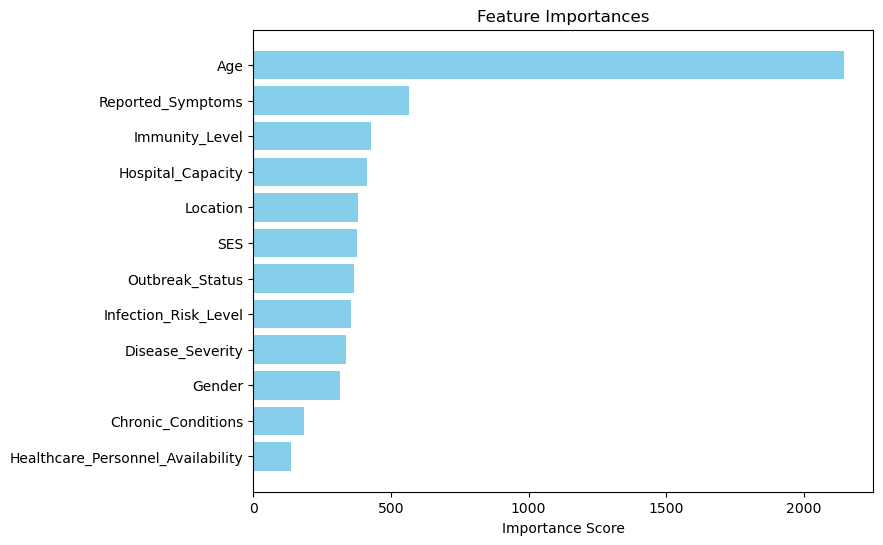

In [9]:
# ensemble learning
# Import required libraries
import pandas as pd
import xgboost as xgb
from sklearn.model_selection import train_test_split, RandomizedSearchCV
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.preprocessing import LabelEncoder, StandardScaler
from imblearn.over_sampling import SMOTE
from scipy.stats import uniform, randint
from sklearn.utils.class_weight import compute_class_weight
import matplotlib.pyplot as plt

# Load your data (replace with actual data loading process)
df = pd.read_csv('public_health_surveillance_dataset.csv')

# Select relevant features and target
features = [
     'Age', 'Gender', 'SES', 'Chronic_Conditions', 
    'Immunity_Level', 'Healthcare_Personnel_Availability', 'Hospital_Capacity','Disease_Severity','Location','Outbreak_Status','Infection_Risk_Level',
    'Reported_Symptoms'
]
target = 'Vaccination_Status'

# Encode categorical variables
label_encoders = {}
for col in features:
    if df[col].dtype == 'object':
        le = LabelEncoder()
        df[col] = le.fit_transform(df[col])
        label_encoders[col] = le

# Encode the target variable
target_encoder = LabelEncoder()
df[target] = target_encoder.fit_transform(df[target])

# Split the data into train and test sets
X = df[features]
y = df[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale numerical features (optional, useful for algorithms like SVM or KNN)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Apply SMOTE for class balancing
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X_train, y_train)
import lightgbm as lgb

lgb_model = lgb.LGBMClassifier(
    objective='multiclass',
    num_class=3,
    random_state=42,
    class_weight='balanced'  # Handle imbalance
)
lgb_model.fit(X_resampled, y_resampled)

# Evaluate the model
y_pred_lgb = lgb_model.predict(X_test)
print("LightGBM Accuracy:", accuracy_score(y_test, y_pred_lgb))
print("Classification Report:\n", classification_report(y_test, y_pred_lgb))

# Feature importance (important to visualize model interpretability)
feature_importances = pd.DataFrame(
    {'Feature': features, 'Importance':lgb_model.feature_importances_}
).sort_values(by='Importance', ascending=False)

print("\nFeature Importances:")
print(feature_importances)

# Plot feature importances (optional)
plt.figure(figsize=(8, 6))
plt.barh(feature_importances['Feature'], feature_importances['Importance'], color='skyblue')
plt.gca().invert_yaxis()  # Highest importance at the top
plt.xlabel("Importance Score")
plt.title("Feature Importances")
plt.show()


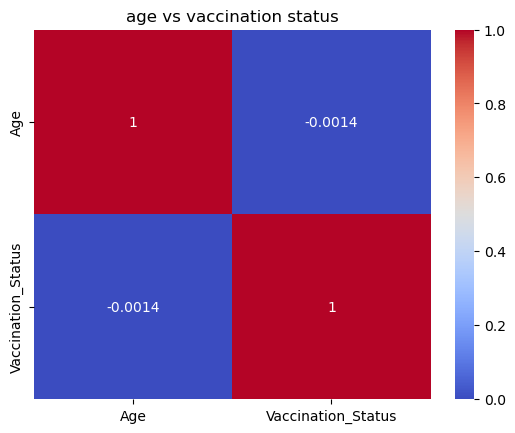

In [9]:
# Assuming df has hospital capacity and disease severity data
import seaborn as sns
corr_matrix = df[['Age', 'Vaccination_Status']].corr()
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')
plt.title('age vs vaccination status')
plt.show()


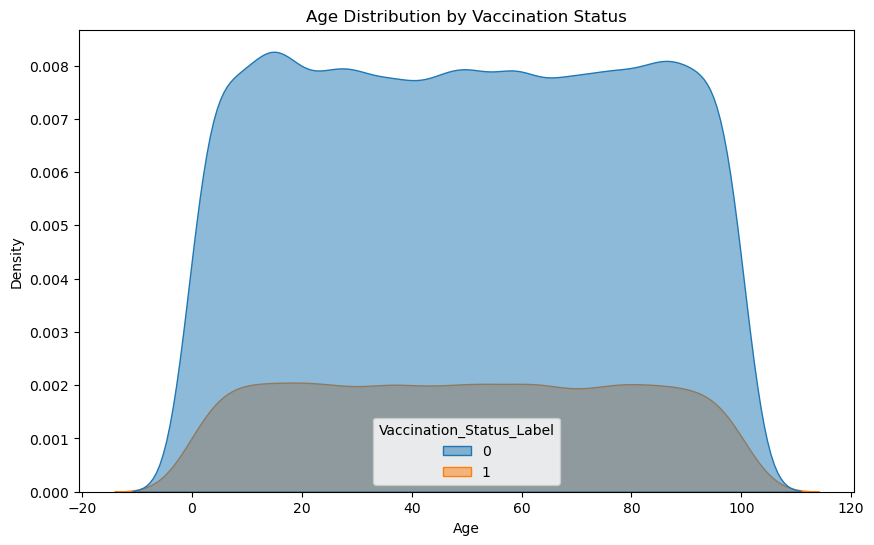

In [10]:
import seaborn as sns
import matplotlib.pyplot as plt

# Combine Age and Vaccination_Status for visualization
df['Vaccination_Status_Label'] = target_encoder.inverse_transform(df[target])

# Density Plot
plt.figure(figsize=(10, 6))
sns.kdeplot(data=df, x='Age', hue='Vaccination_Status_Label', fill=True, alpha=0.5)
plt.title('Age Distribution by Vaccination Status')
plt.xlabel('Age')
plt.ylabel('Density')
plt.show()


C:\Users\SAKSHI\AppData\Local\Temp\ipykernel_7228\385252298.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  vaccination_rates = df.groupby('Age_Group')['Vaccination_Status'].mean()


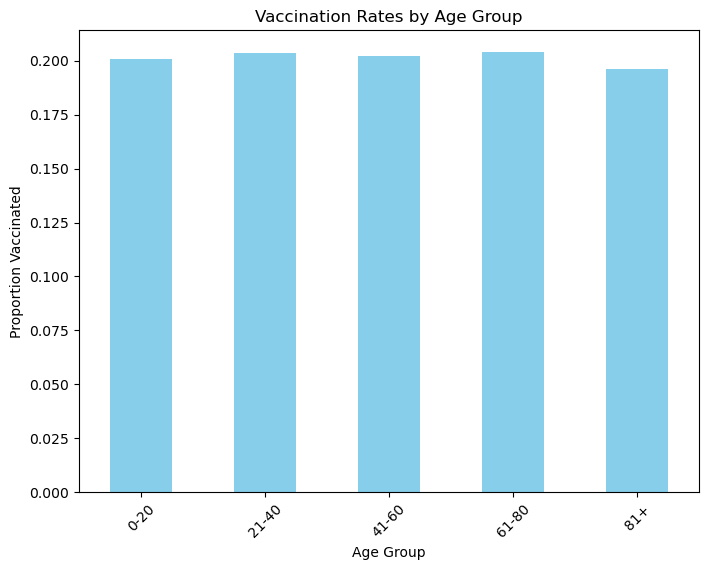

In [11]:
# Create Age Bins
df['Age_Group'] = pd.cut(df['Age'], bins=[0, 20, 40, 60, 80, 100], labels=['0-20', '21-40', '41-60', '61-80', '81+'])

# Calculate Vaccination Rates
vaccination_rates = df.groupby('Age_Group')['Vaccination_Status'].mean()

# Plot Vaccination Rates
vaccination_rates.plot(kind='bar', color='skyblue', figsize=(8, 6))
plt.title('Vaccination Rates by Age Group')
plt.xlabel('Age Group')
plt.ylabel('Proportion Vaccinated')
plt.xticks(rotation=45)
plt.show()


In [12]:
# Check coefficient for Age
importance_df = pd.DataFrame({
    'Feature': features,
    'Coefficient': lgb_model.feature_importances_
}).sort_values(by='Coefficient', ascending=False)

print(importance_df)


                             Feature  Coefficient
0                                Age         4398
4                     Immunity_Level          328
6                  Hospital_Capacity          316
2                                SES          260
1                             Gender          210
7                   Disease_Severity          206
3                 Chronic_Conditions          160
5  Healthcare_Personnel_Availability          122


In [14]:
from scipy.stats import pointbiserialr

correlation, p_value = pointbiserialr(df['Immunity_Level'], df['Vaccination_Status'])
print(f"Point-Biserial Correlation: {correlation:.3f}")
print(f"P-Value: {p_value:.3f}")


Point-Biserial Correlation: -0.001
P-Value: 0.769


C:\Users\SAKSHI\AppData\Local\Temp\ipykernel_7228\1098932473.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='Vaccination_Status_Label', y='Age', palette='Set2')


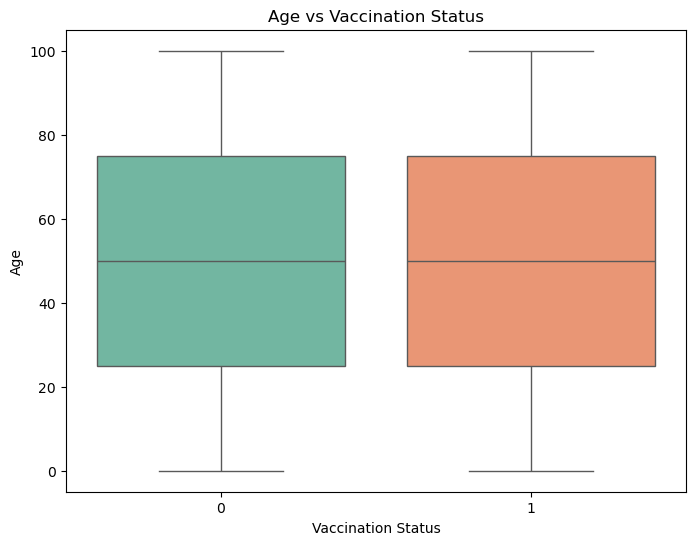

In [15]:
plt.figure(figsize=(8, 6))
sns.boxplot(data=df, x='Vaccination_Status_Label', y='Age', palette='Set2')
plt.title('Age vs Vaccination Status')
plt.xlabel('Vaccination Status')
plt.ylabel('Age')
plt.show()


In [37]:
print(df.columns)

Index(['SES', 'SES_encoded'], dtype='object')


In [38]:
df.head()

,SES,SES_encoded
0,low,1
1,medium,2
2,high,0
3,medium,2
4,low,1


In [39]:
df=pd.read_csv('public_health_surveillance_dataset.csv')

In [42]:
df.head()

,Age,Gender,Location,Ethnicity,SES,Chronic_Conditions,Vaccination_Status,Medical_History,Immunity_Level,Reported_Symptoms,...,Hospital_Capacity,Healthcare_Personnel_Availability,Resource_Utilization,Date_of_Data_Collection,Daily_New_Cases,Vaccination_Campaign_Dates,Outbreak_Status,Infection_Risk_Level,Disease_Severity,Hospitalization_Requirement
0,51,Male,Urban,Ethnicity3,Low,0,0,NaN,Medium,Mild,...,Available,Adequate,3.737815,2023-02-23,17,2023-12-07,No Outbreak,Low Risk,Mild,Requires Hospitalization
1,92,Male,Urban,Ethnicity2,Low,1,0,NaN,Medium,Severe,...,Available,Scarce,86.838729,2024-02-29,17,2023-08-01,No Outbreak,Medium Risk,Mild,Requires Hospitalization
2,14,Male,Urban,Ethnicity3,Low,0,1,NaN,Low,NaN,...,Available,Adequate,65.644500,2023-12-20,20,2023-12-04,Ongoing Outbreak,Low Risk,Moderate,No Hospitalization
3,71,Female,Urban,Ethnicity2,Low,0,0,NaN,Medium,Moderate,...,Limited,Scarce,82.013095,2023-01-28,19,2024-03-19,No Outbreak,Low Risk,Severe,No Hospitalization
4,60,Female,Urban,Ethnicity1,Low,0,0,NaN,Low,Mild,...,Available,Adequate,56.957994,2023-03-26,18,2023-12-27,No Outbreak,Low Risk,Mild,No Hospitalization


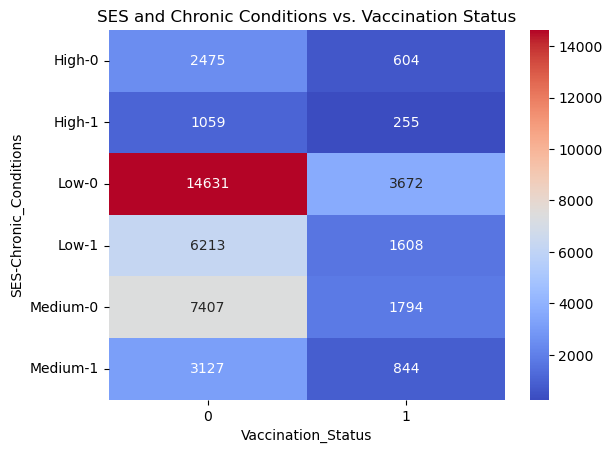

In [40]:
sns.heatmap(pd.crosstab([df['SES'], df['Chronic_Conditions']], df['Vaccination_Status']), annot=True, fmt="d", cmap="coolwarm")
plt.title('SES and Chronic Conditions vs. Vaccination Status')
plt.show()


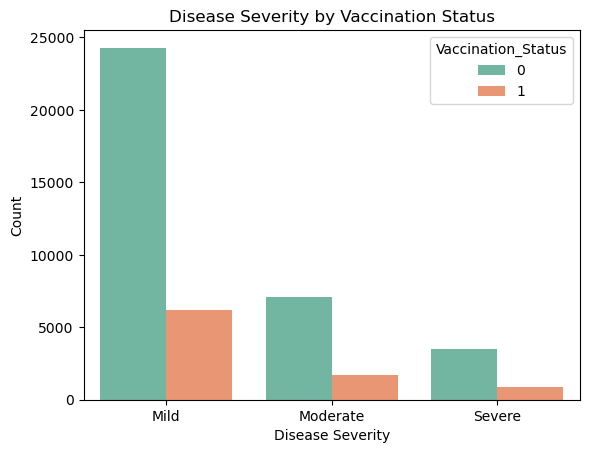

In [43]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.countplot(data=df, x='Disease_Severity', hue='Vaccination_Status', palette='Set2')
plt.title('Disease Severity by Vaccination Status')
plt.xlabel('Disease Severity')
plt.ylabel('Count')
plt.show()


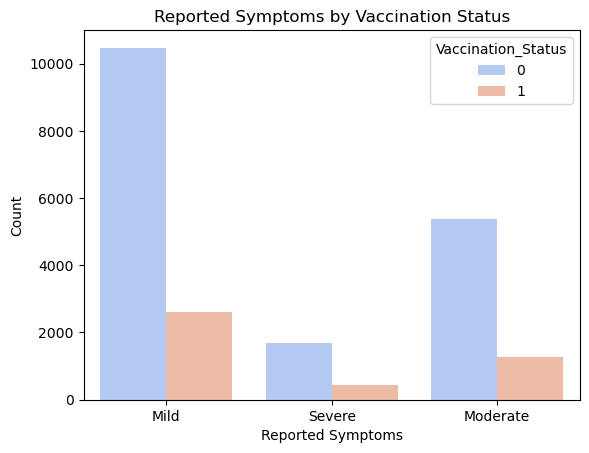

In [44]:
sns.countplot(data=df, x='Reported_Symptoms', hue='Vaccination_Status', palette='coolwarm')
plt.title('Reported Symptoms by Vaccination Status')
plt.xlabel('Reported Symptoms')
plt.ylabel('Count')
plt.show()


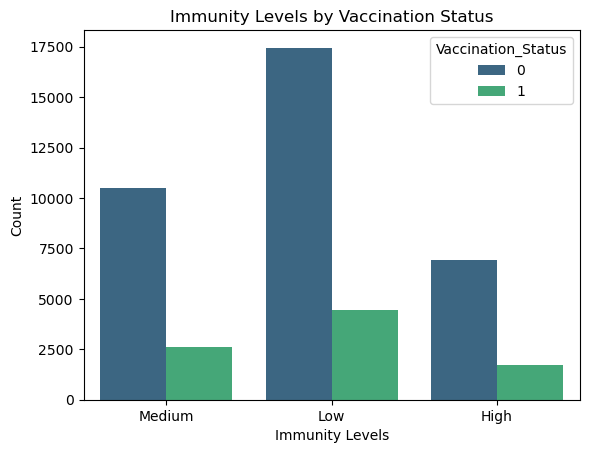

In [45]:
sns.countplot(data=df, x='Immunity_Level', hue='Vaccination_Status', palette='viridis')
plt.title('Immunity Levels by Vaccination Status')
plt.xlabel('Immunity Levels')
plt.ylabel('Count')
plt.show()


In [46]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split

features = ['Disease_Severity', 'Reported_Symptoms', 'Immunity_Level']
X = pd.get_dummies(df[features], drop_first=True)  # One-hot encode categorical variables
y = df['Vaccination_Status']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = LogisticRegression(random_state=42)
model.fit(X_train, y_train)

print("Model Coefficients:", dict(zip(X.columns, model.coef_[0])))


Model Coefficients: {'Disease_Severity_Moderate': -0.06854352987042313, 'Disease_Severity_Severe': -0.03571569922623424, 'Reported_Symptoms_Moderate': -0.11175122068688538, 'Reported_Symptoms_Severe': 0.03407187082915684, 'Immunity_Level_Low': -0.01108669979445181, 'Immunity_Level_Medium': -0.024283325439366885}


In [47]:
from sklearn.ensemble import RandomForestClassifier

rf_model = RandomForestClassifier(random_state=42, class_weight='balanced')
rf_model.fit(X_train, y_train)

feature_importances = pd.DataFrame(
    {'Feature': X.columns, 'Importance': rf_model.feature_importances_}
).sort_values(by='Importance', ascending=False)

print("Feature Importances:\n", feature_importances)


Feature Importances:
                       Feature  Importance
2  Reported_Symptoms_Moderate    0.273117
0   Disease_Severity_Moderate    0.176572
5       Immunity_Level_Medium    0.169077
4          Immunity_Level_Low    0.146179
3    Reported_Symptoms_Severe    0.122694
1     Disease_Severity_Severe    0.112361


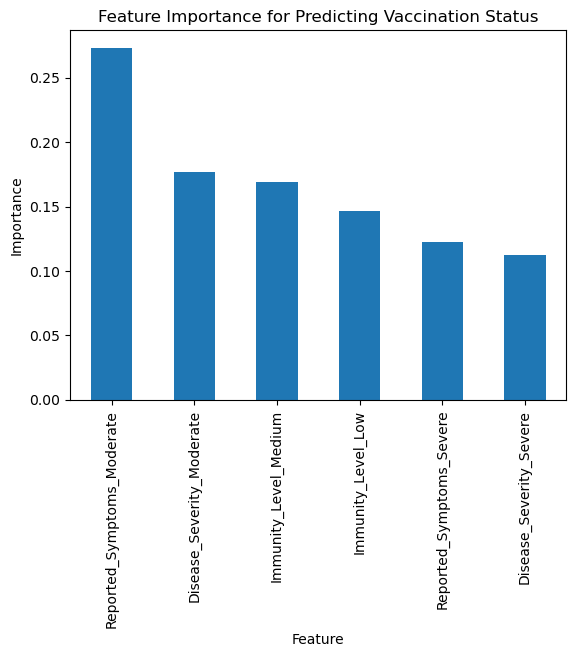

In [48]:
feature_importances.plot(kind='bar', x='Feature', y='Importance', legend=False)
plt.title('Feature Importance for Predicting Vaccination Status')
plt.xlabel('Feature')
plt.ylabel('Importance')
plt.show()


In [49]:
importance_df = pd.DataFrame({
    'Feature': features,
    'Importance': feature_importances
})

# Sort the DataFrame by importance
importance_df = importance_df.sort_values(by='Importance', ascending=True)

# Plotting the feature importances
plt.figure(figsize=(10, 6))
plt.barh(importance_df['Feature'], importance_df['Importance'], color='skyblue')
plt.xlabel('Feature Importance')
plt.title('Feature Importance from LightGBM Model')
plt.gca().invert_yaxis()  # Highest importance at the top
plt.show()

ValueError: 2

C:\Users\SAKSHI\AppData\Local\Temp\ipykernel_7380\3115353167.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  age_vaccination_dist = df.groupby(['Age_Binned', 'Vaccination_Status']).size().unstack()


NameError: name 'plt' is not defined

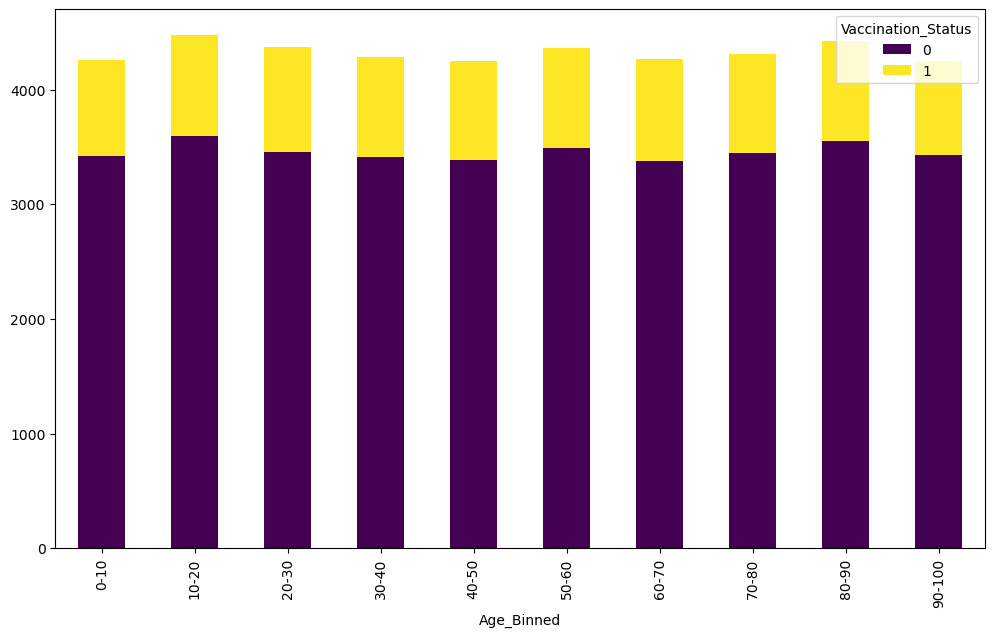

In [5]:
# Define age bins
age_bins = range(0, 101, 10)
age_labels = [f"{i}-{i+10}" for i in age_bins[:-1]]

# Create Age Bins
df['Age_Binned'] = pd.cut(df['Age'], bins=age_bins, labels=age_labels, right=False)

# Group by Age_Binned and Vaccination_Status
age_vaccination_dist = df.groupby(['Age_Binned', 'Vaccination_Status']).size().unstack()

# Plot Age Distribution by Vaccination Status
age_vaccination_dist.plot(kind='bar', stacked=True, figsize=(12, 7), cmap='viridis')
plt.title('Age Distribution by Vaccination Status', fontsize=14)
plt.xlabel('Age Group', fontsize=12)
plt.ylabel('Count', fontsize=12)
plt.xticks(rotation=45)
plt.legend(title='Vaccination Status', fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


NameError: name 'plt' is not defined

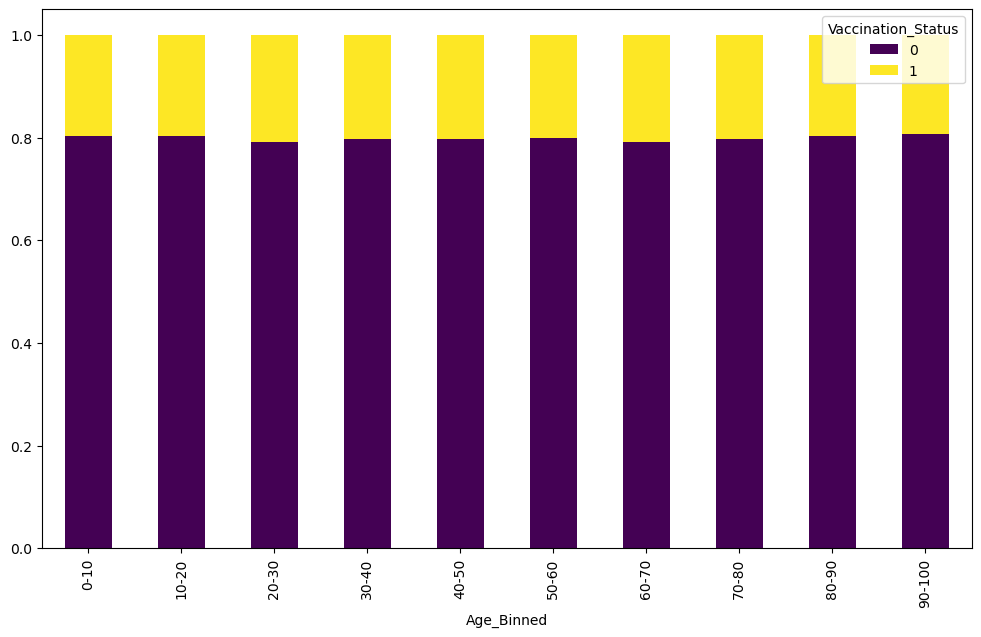

In [6]:
# Normalize the counts within each Age_Binned group
age_vaccination_normalized = age_vaccination_dist.div(age_vaccination_dist.sum(axis=1), axis=0)

# Plot proportions
age_vaccination_normalized.plot(kind='bar', stacked=True, figsize=(12, 7), cmap='viridis')
plt.title('Proportion of Vaccination Status by Age Group', fontsize=14)
plt.xlabel('Age Group', fontsize=12)
plt.ylabel('Proportion', fontsize=12)
plt.xticks(rotation=45)
plt.legend(title='Vaccination Status', fontsize=10)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()


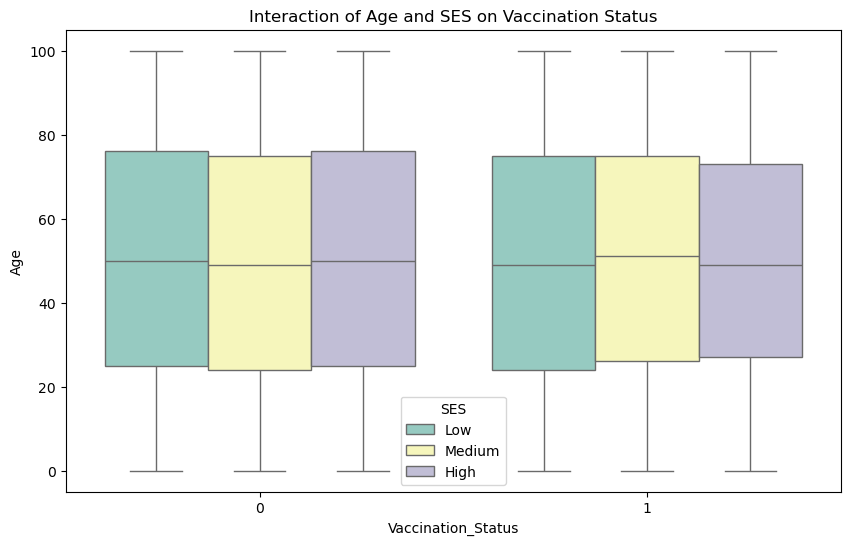

In [8]:
import seaborn as sns
import matplotlib.pyplot as plt

# Example: Interaction between Age and SES
plt.figure(figsize=(10, 6))
sns.boxplot(x='Vaccination_Status', y='Age', hue='SES', data=df, palette='Set3')
plt.title('Interaction of Age and SES on Vaccination Status')
plt.show()


C:\Users\SAKSHI\anaconda3\envs\new_env\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
 99%|===================| 8693/8738 [02:31<00:00]        

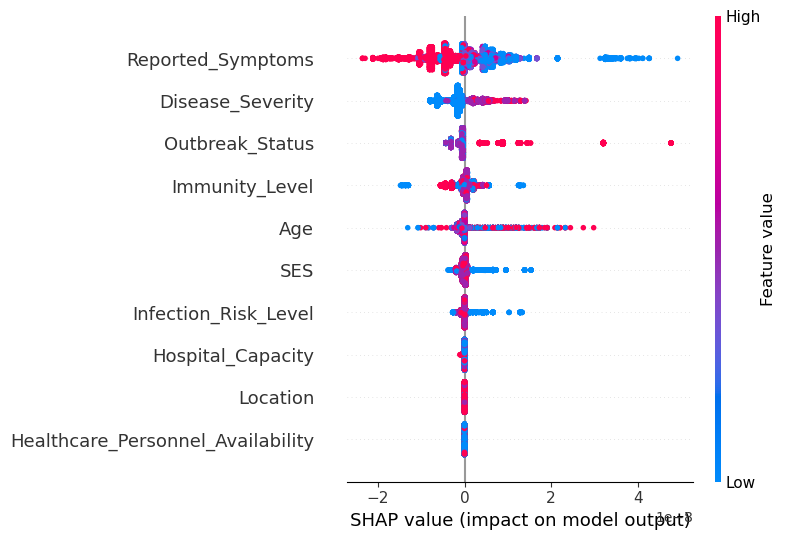

In [10]:
import shap

# Initialize SHAP explainer
explainer = shap.Explainer(lgb_model, X_test)
shap_values = explainer(X_test)

# Plot SHAP summary for Age
shap.summary_plot(shap_values, features=X_test, feature_names=features, max_display=10)


In [11]:
shap.dependence_plot('Age', shap_values, X_test, interaction_index=None)


ValueError: Could not find feature named: Age

In [12]:
corr_matrix = df[features].corr()
print(corr_matrix['Age'].sort_values(ascending=False))


Age                                  1.000000
Hospital_Capacity                    0.007709
Location                             0.002275
Disease_Severity                     0.001193
Gender                               0.001120
Outbreak_Status                      0.000452
Reported_Symptoms                   -0.000800
Immunity_Level                      -0.001075
SES                                 -0.002882
Healthcare_Personnel_Availability   -0.003300
Infection_Risk_Level                -0.003503
Chronic_Conditions                  -0.008340
Name: Age, dtype: float64


In [13]:
age_index = features.index('Age')  # Assuming 'Age' is in your original features list
shap.dependence_plot(age_index, shap_values, X_test)


TypeError: loop of ufunc does not support argument 0 of type Explanation which has no callable conjugate method

In [14]:
print(X_test.columns)


AttributeError: 'numpy.ndarray' object has no attribute 'columns'

In [15]:
import pandas as pd

# Reattach column names to X_test
X_test = pd.DataFrame(X_test, columns=features)

# Check if the columns are now accessible
print(X_test.columns)


Index(['Age', 'Gender', 'SES', 'Chronic_Conditions', 'Immunity_Level',
       'Healthcare_Personnel_Availability', 'Hospital_Capacity',
       'Disease_Severity', 'Location', 'Outbreak_Status',
       'Infection_Risk_Level', 'Reported_Symptoms'],
      dtype='object')


In [16]:
shap.dependence_plot('Age', shap_values, X_test)


TypeError: loop of ufunc does not support argument 0 of type Explanation which has no callable conjugate method

In [17]:
X_train = pd.DataFrame(X_train, columns=features)
X_test = pd.DataFrame(X_test, columns=features)


In [18]:
explainer = shap.Explainer(lgb_model, X_train)


In [22]:
shap_values = explainer(X_test)
!pip show shap



100%|===================| 8704/8738 [02:29<00:00]        

Name: shap
Version: 0.46.0
Summary: A unified approach to explain the output of any machine learning model.
Home-page: 
Author: 
Author-email: Scott Lundberg <slund1@cs.washington.edu>
License: MIT License
Location: C:\Users\SAKSHI\anaconda3\envs\new_env\Lib\site-packages
Requires: cloudpickle, numba, numpy, packaging, pandas, scikit-learn, scipy, slicer, tqdm
Required-by: 


In [23]:
!pip install shap --upgrade


In [24]:
explainer = shap.Explainer(lgb_model, X_train)


In [25]:
shap_values = explainer(X_test)  # Returns a SHAP 'Explanation' object


100%|===================| 8703/8738 [02:25<00:00]        

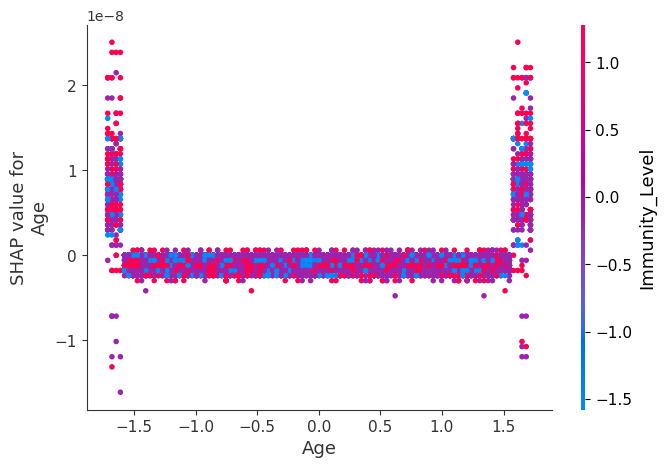

In [26]:
shap.dependence_plot('Age', shap_values.values, X_test)


In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43689 entries, 0 to 43688
Data columns (total 35 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Age                                43689 non-null  int64  
 1   Gender                             43689 non-null  int32  
 2   Location                           43689 non-null  int32  
 3   Ethnicity                          43689 non-null  object 
 4   SES                                43689 non-null  int32  
 5   Chronic_Conditions                 43689 non-null  int64  
 6   Vaccination_Status                 43689 non-null  int64  
 7   Medical_History                    17430 non-null  object 
 8   Immunity_Level                     43689 non-null  int32  
 9   Reported_Symptoms                  43689 non-null  int32  
 10  Diagnosis                          13050 non-null  object 
 11  Testing_Results                    43689 non-null  obj